In [3]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import patsy
import pickle
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

with open('pga.pickle', 'rb') as file:
    g = pickle.load(file)
g.shape

(1435, 20)

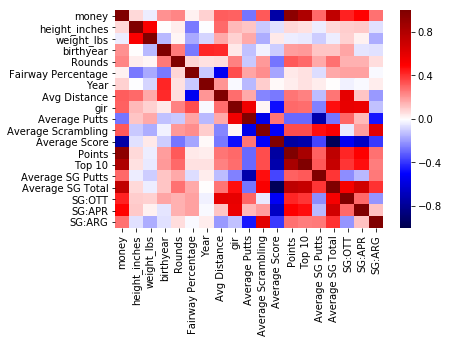

In [2]:
sns.heatmap(g.corr(), cmap='seismic', vmin=-1, vmax=1)
plt.show()
plt.close()

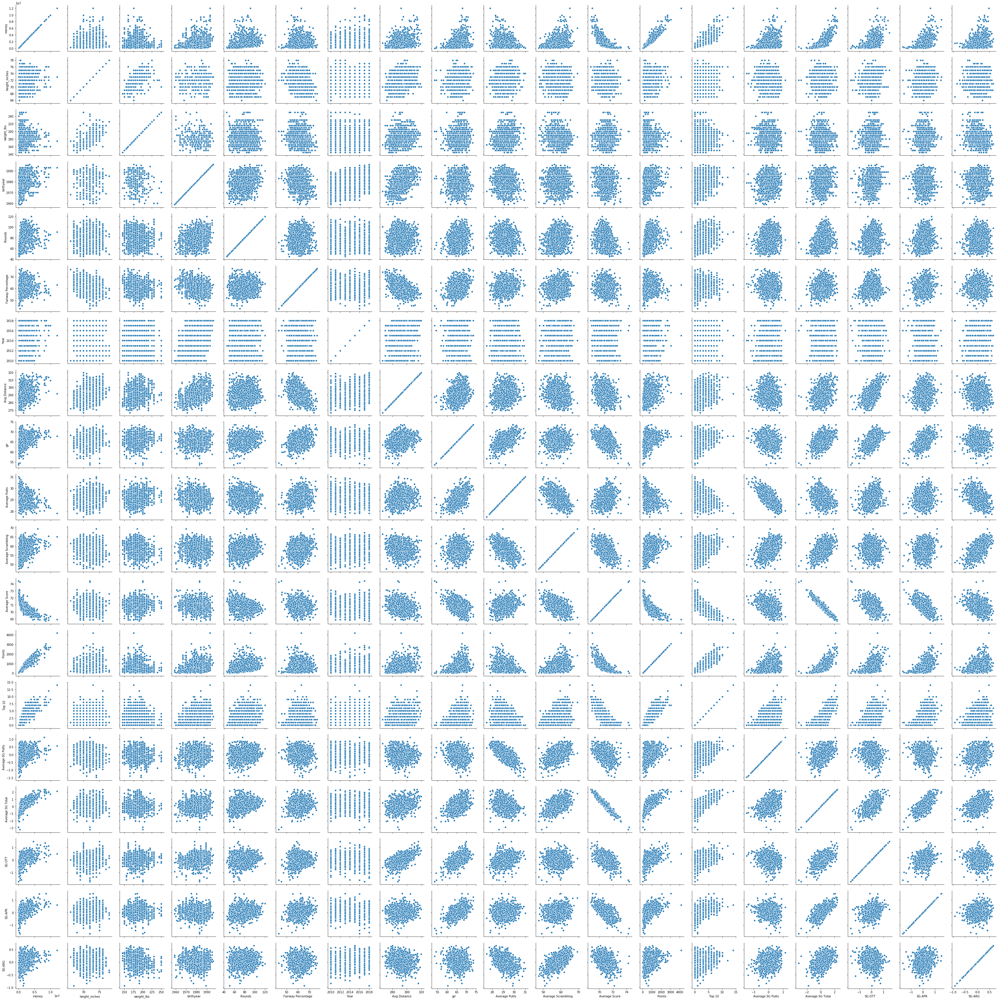

In [3]:
fig = sns.pairplot(g, diag_kind=None).set_syle=('dark')
#plt.savefig('pairplot.png', transparent=False)
plt.show()
plt.close()

In [4]:
g.columns

Index(['money', 'name', 'height_inches', 'weight_lbs', 'birthyear', 'Rounds',
       'Fairway Percentage', 'Year', 'Avg Distance', 'gir', 'Average Putts',
       'Average Scrambling', 'Average Score', 'Points', 'Top 10',
       'Average SG Putts', 'Average SG Total', 'SG:OTT', 'SG:APR', 'SG:ARG'],
      dtype='object')

In [5]:
g_small = g.drop(['Average Score', 'Points', 'Top 10', 'Average SG Total', 'Year','name'], axis=1)

In [6]:
g_small.head()

,money,height_inches,weight_lbs,birthyear,Rounds,Fairway Percentage,Avg Distance,gir,Average Putts,Average Scrambling,Average SG Putts,SG:OTT,SG:APR,SG:ARG
0,25271,73.0,180,1971,51.0,55.06,282.2,63.73,30.41,50.75,-0.491,-0.631,-0.460,-0.368
1,271887,73.0,180,1971,63.0,63.06,282.7,66.67,30.03,51.69,-0.754,-0.262,0.260,-0.213
2,514288,73.0,180,1971,83.0,61.47,284.9,67.63,29.85,59.96,-0.163,-0.050,0.552,-0.234
3,204272,73.0,180,1971,58.0,57.87,284.9,62.40,29.64,52.77,-0.337,-0.733,0.296,-0.085
4,808927,73.0,180,1971,76.0,59.34,286.7,65.79,29.91,50.85,-0.428,-0.449,0.537,-0.286


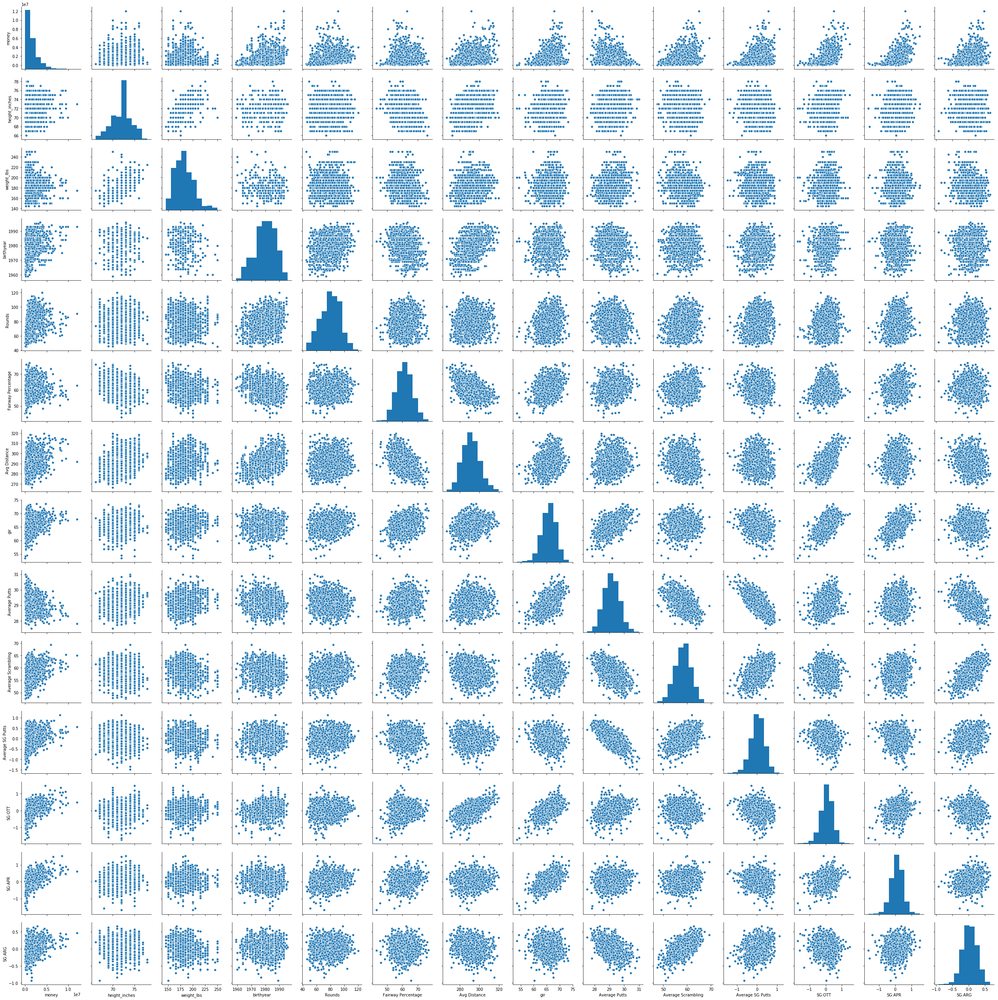

In [7]:
fig = sns.pairplot(g_small).set_syle=('dark')
#plt.savefig('smallerpairplot.png', transparent=False)
plt.show()
plt.close()

In [8]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

In [9]:
#Simple validation method: train/validation/test  60-20-20

X, y = g_small.drop('money', axis=1), g_small['money']

X, X_test, y, y_test = train_test_split(X, y, test_size=.2, random_state=42)

In [10]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.25, random_state=3)

In [11]:
lm = LinearRegression()

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train.values)
X_val_scaled = scaler.transform(X_val.values)
X_test_scaled = scaler.transform(X_test.values)

lm_reg = Ridge(alpha=1)

poly = PolynomialFeatures(degree=2) 

X_train_poly = poly.fit_transform(X_train.values)
X_val_poly = poly.transform(X_val.values)
X_test_poly = poly.transform(X_test.values)

lm_poly = LinearRegression()

In [12]:
lm.fit(X_train, y_train)
print(f'Linear Regression val R^2: {lm.score(X_val, y_val):.3f}')

lm_reg.fit(X_train_scaled, y_train)
print(f'Ridge Regression val R^2: {lm_reg.score(X_val_scaled, y_val):.3f}')

lm_poly.fit(X_train_poly, y_train)
print(f'Degree 2 polynomial regression val R^2: {lm_poly.score(X_val_poly, y_val):.3f}')

Linear Regression val R^2: 0.553
Ridge Regression val R^2: 0.553
Degree 2 polynomial regression val R^2: 0.663


In [13]:
lm_poly.fit(X,y)
print(f'Degree 2 polynomial regression val R^2: {lm_poly.score(X_test, y_test):.3f}')

Degree 2 polynomial regression val R^2: 0.612


***
**Try Log Transformation**

In [14]:
import math
g_small['logmoney'] = g_small['money'].apply(lambda x: math.log(x))

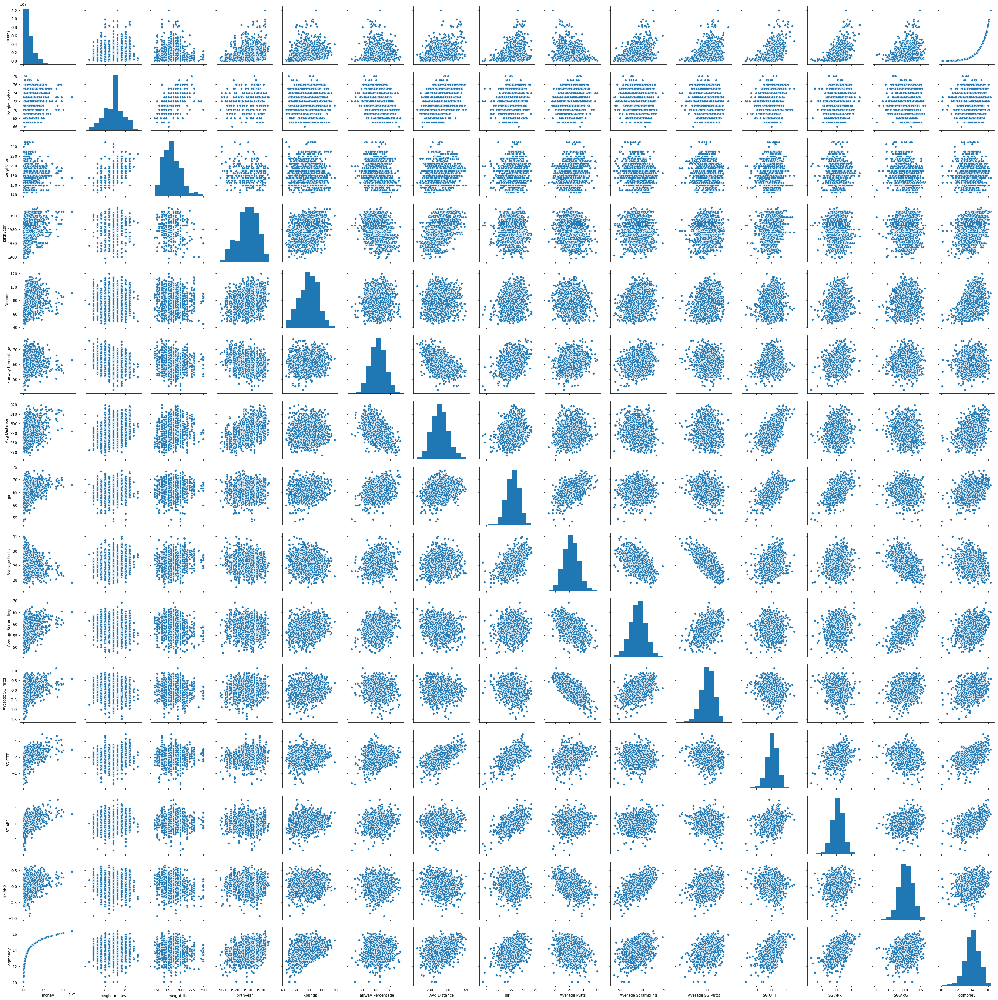

In [15]:
fig = sns.pairplot(g_small).set_syle=('dark')
#plt.savefig('logplot.png', transparent=False)
plt.show()
plt.close()

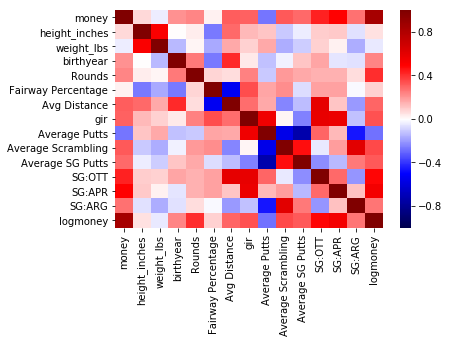

In [16]:
sns.heatmap(g_small.corr(), cmap='seismic', vmin=-1, vmax=1)
plt.show()
plt.close()

In [17]:
g_small.corr()

,money,height_inches,weight_lbs,birthyear,Rounds,Fairway Percentage,Avg Distance,gir,Average Putts,Average Scrambling,Average SG Putts,SG:OTT,SG:APR,SG:ARG,logmoney
money,1.000000,0.076239,-0.032494,0.213610,0.239102,0.027474,0.316777,0.306611,-0.266828,0.320547,0.290540,0.435384,0.496893,0.275590,0.851547
height_inches,0.076239,1.000000,0.520670,0.003740,0.037186,-0.261061,0.293811,0.132858,0.115985,-0.105004,-0.038458,0.097723,0.107365,-0.055415,0.056130
weight_lbs,-0.032494,0.520670,1.000000,-0.135173,0.016704,-0.164263,0.169250,0.089212,0.167638,-0.163442,-0.100936,0.091074,0.026570,-0.158495,-0.039576
birthyear,0.213610,0.003740,-0.135173,1.000000,0.261021,-0.258962,0.416436,0.041995,-0.118160,-0.026150,0.116352,0.178420,-0.051791,-0.060988,0.238317
Rounds,0.239102,0.037186,0.016704,0.261021,1.000000,0.081012,0.067720,0.244681,-0.105069,0.202199,0.168994,0.154982,0.152273,0.067228,0.412711
Fairway Percentage,0.027474,-0.261061,-0.164263,-0.258962,0.081012,1.000000,-0.533872,0.349011,0.172919,0.225022,-0.067856,0.186847,0.183440,-0.008626,0.086300
Avg Distance,0.316777,0.293811,0.169250,0.416436,0.067720,-0.533872,1.000000,0.288542,0.166852,-0.238945,-0.126823,0.599848,0.109661,-0.198124,0.304358
gir,0.306611,0.132858,0.089212,0.041995,0.244681,0.349011,0.288542,1.000000,0.559709,0.019674,-0.249136,0.587987,0.572204,-0.123666,0.342803
Average Putts,-0.266828,0.115985,0.167638,-0.118160,-0.105069,0.172919,0.166852,0.559709,1.000000,-0.560378,-0.729906,0.304393,0.137161,-0.453284,-0.274065
Average Scrambling,0.320547,-0.105004,-0.163442,-0.026150,0.202199,0.225022,-0.238945,0.019674,-0.560378,1.000000,0.471112,-0.040989,0.190625,0.613033,0.356164


In [18]:
#Simple validation method: train/validation/test  60-20-20

X, y = g_small.drop(['logmoney','money'], axis=1), g_small['logmoney']

X, X_test, y, y_test = train_test_split(X, y, test_size=.2, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=.25, random_state=3)

lm = LinearRegression()

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train.values)
X_val_scaled = scaler.transform(X_val.values)
X_test_scaled = scaler.transform(X_test.values)

lm_reg = Ridge(alpha=10)

poly = PolynomialFeatures(degree=2) 

X_train_poly = poly.fit_transform(X_train.values)
X_val_poly = poly.transform(X_val.values)
X_test_poly = poly.transform(X_test.values)

lm_poly = LinearRegression()

lm.fit(X_train, y_train)
print(f'Linear Regression train R^2: {lm.score(X_train, y_train):.3f}')
print(f'Linear Regression val R^2: {lm.score(X_val, y_val):.3f}')

lm_reg.fit(X_train_scaled, y_train)
print(f'Ridge Regression train R^2: {lm_reg.score(X_train_scaled, y_train):.3f}')
print(f'Ridge Regression val R^2: {lm_reg.score(X_val_scaled, y_val):.3f}')


lm_poly.fit(X_train_poly, y_train)
print(f'Degree 2 polynomial regression train R^2: {lm_poly.score(X_train_poly,y_train):.3f}')
print(f'Degree 2 polynomial regression val R^2: {lm_poly.score(X_val_poly, y_val):.3f}')

Linear Regression train R^2: 0.756
Linear Regression val R^2: 0.704
Ridge Regression train R^2: 0.756
Ridge Regression val R^2: 0.705
Degree 2 polynomial regression train R^2: 0.783
Degree 2 polynomial regression val R^2: 0.710


In [19]:
lm_reg.fit(X,y)
print(f'Ridge Regression val R^2: {lm_reg.score(X_test, y_test):.3f}')

Ridge Regression val R^2: 0.752


In [20]:
lm.coef_

array([-2.70791219e-03, -9.00409201e-04,  1.23478091e-02,  1.25263939e-02,
        8.70959865e-03,  2.75631715e-03, -2.97859425e-02, -2.19564472e-01,
       -4.78944809e-02,  9.04826638e-01,  1.17355947e+00,  1.19675174e+00,
        1.08618198e+00])

***
**Tweak model with lasso and ridge**

In [21]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV
from sklearn.metrics import r2_score

%pylab inline
%config InlineBackend.figure_format = 'svg'

Populating the interactive namespace from numpy and matplotlib


/home/rob/anaconda3/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['poly']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [22]:
lasso_model = Lasso(alpha = 0.01)
lasso_model.fit(X_train, y_train)
list(zip(X_train.columns, lasso_model.coef_))

[('height_inches', 0.0),
 ('weight_lbs', -0.0013659163120873148),
 ('birthyear', 0.010726365393413003),
 ('Rounds', 0.012834081451809625),
 ('Fairway Percentage', 0.012896064710869057),
 ('Avg Distance', 0.010528841966739892),
 ('gir', -0.008258376570863792),
 ('Average Putts', -0.30338589776930225),
 ('Average Scrambling', -0.02048347625925997),
 ('Average SG Putts', 0.64726177517168),
 ('SG:OTT', 0.8727341951469311),
 ('SG:APR', 1.0554022908001122),
 ('SG:ARG', 0.6507187040069968)]

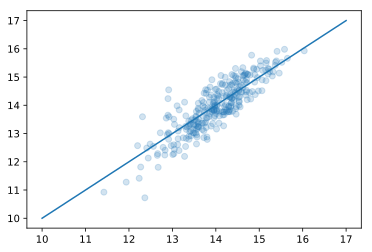

In [23]:
test_set_pred = lasso_model.predict(X_test)
plt.scatter(test_set_pred, y_test, alpha=.2)
plt.plot(np.linspace(10,17,100), np.linspace(10,17,100))

In [24]:
r2_score(y_test, test_set_pred)

0.7510950573204426

In [25]:
lasso_model = Lasso(alpha = .01)
lasso_model.fit(X_train_scaled, y_train)
list(zip(X_train.columns, lasso_model.coef_))

[('height_inches', -0.0),
 ('weight_lbs', -0.012988929553575118),
 ('birthyear', 0.08096138072454484),
 ('Rounds', 0.16136960855061674),
 ('Fairway Percentage', 0.0),
 ('Avg Distance', 0.0),
 ('gir', -0.018877939532148315),
 ('Average Putts', -0.1343543559658228),
 ('Average Scrambling', -0.10978234509155896),
 ('Average SG Putts', 0.2657317665398891),
 ('SG:OTT', 0.4255590470033466),
 ('SG:APR', 0.4168697820193211),
 ('SG:ARG', 0.20472940060312325)]

***

In [26]:
lr_model_ridge = Ridge(alpha = 10)
lr_model_ridge.fit(X_train, y_train)
list(zip(X_train.columns, lr_model_ridge.coef_))

[('height_inches', 0.0004990873235566929),
 ('weight_lbs', -0.0012753967362231003),
 ('birthyear', 0.010357944162137273),
 ('Rounds', 0.01276013384044024),
 ('Fairway Percentage', 0.01668778385684913),
 ('Avg Distance', 0.011937501320901473),
 ('gir', -0.0024419471479371815),
 ('Average Putts', -0.3703920051592118),
 ('Average Scrambling', -0.029633743024754033),
 ('Average SG Putts', 0.6411199866766341),
 ('SG:OTT', 0.8597549841584868),
 ('SG:APR', 1.029235683674809),
 ('SG:ARG', 0.7196888729561443)]

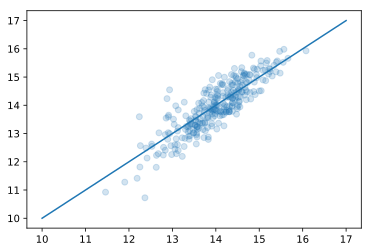

In [27]:
test_set_pred = lr_model_ridge.predict(X_test)
plt.scatter(test_set_pred, y_test, alpha=.2)
plt.plot(np.linspace(10,17,100), np.linspace(10,17,100))

In [28]:
r2_score(y_test, test_set_pred)

0.7501673509019827

***

In [29]:
from sklearn.linear_model import lars_path

In [30]:
alphas, _, coefs = lars_path(X_train_scaled, y_train.values, method='lasso')

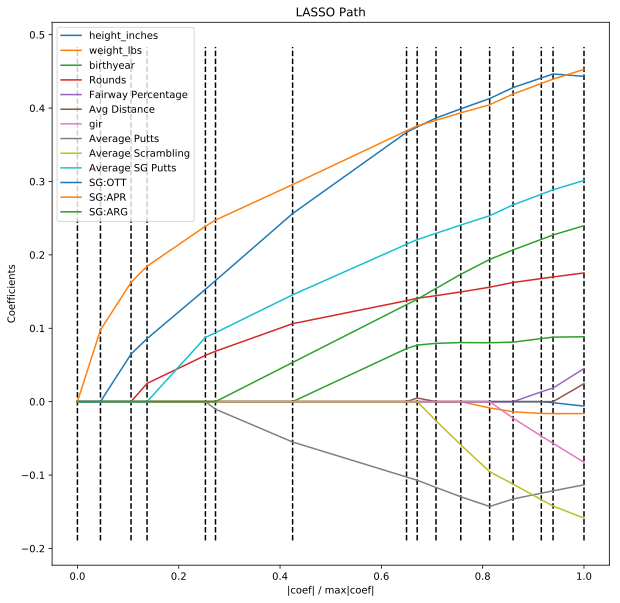

In [31]:
xx = np.sum(np.abs(coefs.T), axis=1)
xx /= xx[-1]

plt.figure(figsize=(10,10))
plt.plot(xx, coefs.T)
ymin, ymax = plt.ylim()
plt.vlines(xx, ymin, ymax, linestyle='dashed')
plt.xlabel('|coef| / max|coef|')
plt.ylabel('Coefficients')
plt.title('LASSO Path')
plt.axis('tight')
plt.legend(X_train.columns)
plt.show()

***